# Goal Of this is find best seller from given dataset

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
 

Matplotlib is building the font cache; this may take a moment.


In [2]:
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics
from xgboost import XGBRegressor

/home/amol/.local/lib/python3.8/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 0.1.36ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(
/home/amol/.local/lib/python3.8/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 0.23ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(


In [3]:
import pandas_profiling

In [37]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [4]:
df=pd.read_excel('Sample_Longlist_Data.xlsx')

In [5]:
df.head() 

,Date Added,category,sellerlink,sellerlink-url,sellerstorefront-url,sellerproductcount,sellerratings,sellerdetails,seller business name,businessaddress,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings,Hero Product 2 #ratings,Sample brand name,Sample Brand URL
0,2020-11-15,Garden,Seller 1,Seller 1-link,Seller 1-storefrontlink,"1-16 of over 100,000 results",88% positive in the last 12 months (118 ratings),Lohas Living Inc James Mazzello US 845 3RD Ave...,Business Name:Lohas Living Inc,411 THEODORE FREMD AVESTE 206 SOUTHRyeNY10580-...,16,17,11,12,5873,4957,Visit the YAMAZAKI Store,https://www.amazon.de/-/en/stores/YAMAZAKI/pag...
1,2020-11-15,Garden,Seller 2,Seller 2-link,Seller 2-storefrontlink,NaN,90% positive in the last 12 months (566 ratings),Herzlich Willkommen im Amazon Shop von 1a-Hand...,Business Name:1a-Handelsagentur,1a HandelsagenturLindenallee 2MalchowMecklenbu...,0,2,2,9,0,0,Visit the tesa Store,https://www.amazon.de/-/en/stores/tesa/page/12...
2,2020-11-15,Garden,Seller 3,Seller 3-link,Seller 3-storefrontlink,"1-16 of over 2,000 results",85% positive in the last 12 months (75 ratings),67878u6i7 is committed to providing each custo...,Business Name:nantongaohuanfangzhipinyouxiango...,zhongnanshijicheng27zhuang1410haochongchuanqun...,15,0,25,12,164,162,TXYFYP,https://www.amazon.de/-/en/s/ref=bl_dp_s_web_0...
3,2020-11-15,Garden,Seller 4,Seller 4-link,Seller 4-storefrontlink,1-16 of 123 results,NaN,7 days home life supermarket is committed to p...,Business Name:Zhengzhou Yaoqiong Trading Company,河南省中兴南路福禄街自贸试验区郑州片区（郑东）河南商会大厦1901室450000CN,1,0,0,0,0,0,SHIFENG,https://www.amazon.de/-/en/s/ref=bl_dp_s_web_0...
4,2020-11-15,Garden,Seller 5,Seller 5-link,Seller 5-storefrontlink,"1-16 of over 1,000 results",81% positive in the last 12 months (52 ratings),78 68yui678 is committed to providing each cus...,Business Name:shenzhenfeichangshangmeimaoyiyou...,minzhidadaoshaxialaocun94dongA901longhuaxinqus...,16,0,31,15,224,113,YUOKI99,https://www.amazon.de/-/en/s/ref=bl_dp_s_web_0...


In [6]:
df.shape

(1839, 18)

In [7]:
column_names = list(df.columns.values)
print(column_names,len(column_names))

['Date Added', 'category', 'sellerlink', 'sellerlink-url', 'sellerstorefront-url', 'sellerproductcount', 'sellerratings', 'sellerdetails', 'seller business name', 'businessaddress', 'Count of seller brands', 'Max % of negative seller ratings - last 30 days', 'Max % of negative seller ratings - last 90 days', 'Max % of negative seller ratings - last 12 months', 'Hero Product 1 #ratings', 'Hero Product 2 #ratings', 'Sample brand name', 'Sample Brand URL'] 18


In [8]:
df['seller business name'].value_counts()

Business Name:Lohas Living Inc                                      1
Business Name:XiaoYiShiZhongYangLouJieDaoBaiHuiQiCheFuWuZhongXin    1
Business Name:DanChengXianJuXiangJiaFangDian                        1
Business Name:yulinshiyuyangqugaoxiboriyongpindian                  1
Business Name:ShanXiBoYiWenMaoYiYouXianGongSi                       1
                                                                   ..
Business Name:xianshiyantaqutianhengjiabaihuoshangdian              1
Business Name:Shenzhenshi Tianhai Zongzhi Keji Youxian Gongsi       1
Business Name:Thüros GmbH                                           1
Business Name:shenzhenshiyulantian dianzikejiyouxiangongsi          1
Business Name:nanchangshiyunjianshejizhuangshigongcheng             1
Name: seller business name, Length: 1783, dtype: int64

In [9]:
df.isnull().sum()

Date Added                                             0
category                                               0
sellerlink                                             0
sellerlink-url                                         0
sellerstorefront-url                                   0
sellerproductcount                                   326
sellerratings                                        428
sellerdetails                                         27
seller business name                                  56
businessaddress                                       75
Count of seller brands                                 0
Max % of negative seller ratings - last 30 days        0
Max % of negative seller ratings - last 90 days        0
Max % of negative seller ratings - last 12 months      0
Hero Product 1 #ratings                                0
Hero Product 2 #ratings                                0
Sample brand name                                      4
Sample Brand URL               

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1839 entries, 0 to 1838
Data columns (total 18 columns):
 #   Column                                             Non-Null Count  Dtype         
---  ------                                             --------------  -----         
 0   Date Added                                         1839 non-null   datetime64[ns]
 1   category                                           1839 non-null   object        
 2   sellerlink                                         1839 non-null   object        
 3   sellerlink-url                                     1839 non-null   object        
 4   sellerstorefront-url                               1839 non-null   object        
 5   sellerproductcount                                 1513 non-null   object        
 6   sellerratings                                      1411 non-null   object        
 7   sellerdetails                                      1812 non-null   object        
 8   seller business na

In [11]:
df.describe()

,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings,Hero Product 2 #ratings
count,1839.000000,1839.000000,1839.000000,1839.000000,1839.000000,1839.000000
mean,6.951060,5.808592,7.632409,12.312670,1399.745514,765.173464
std,6.232073,18.117027,19.902394,23.435871,6204.123987,3817.355945
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.000000,0.000000,0.000000,0.000000,3.000000,1.000000
75%,15.000000,0.000000,4.000000,14.000000,176.500000,87.500000
max,16.000000,100.000000,100.000000,100.000000,86856.000000,70732.000000


So total number of columns is 18 but logically some of them is not required 
to identify best seller, so we can drop that unnecsesory column 

In [14]:
 df = df.drop(['Date Added', 'category','sellerlink', 'sellerlink-url', 
                   'sellerstorefront-url', 'sellerdetails','seller business name', 
                   'businessaddress','Sample Brand URL',"Sample brand name"], axis=1)

In [15]:
df.shape

(1839, 8)

# For detailed report we can used pandas function which is profile_report()

In [17]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

we can see in above analysis as there is missing value so here best way to drop it

In [18]:
df=df.dropna()

from above anlysis hero product 1 and 2 are highly correlated we drop one of them.
So logically I dropped hero product 2, Since hero product 1 is more important 
determining factor.


In [19]:
df = df.drop(['Hero Product 2 #ratings'],axis =1)
df.head()

,sellerproductcount,sellerratings,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings
0,"1-16 of over 100,000 results",88% positive in the last 12 months (118 ratings),16,17,11,12,5873
2,"1-16 of over 2,000 results",85% positive in the last 12 months (75 ratings),15,0,25,12,164
4,"1-16 of over 1,000 results",81% positive in the last 12 months (52 ratings),16,0,31,15,224
8,1-16 of 133 results,100% positive lifetime (4 total ratings),1,0,0,0,65
10,"1-16 of over 4,000 results",100% positive lifetime (3 total ratings),15,0,0,0,2


In [20]:
df.shape

(1198, 7)

"sellerproductcount" is in string format we have to extract integer from it which 
may be useful

In [22]:
def get_product_cnt(string):
    li = string.split(' ')
    s = li[-2]
    l1 = s.split(',')
    t=""
    for x in l1:
        t = t+ x
    
    return int(t)
print(df['sellerproductcount'])

0       1-16 of over 100,000 results
2         1-16 of over 2,000 results
4         1-16 of over 1,000 results
8                1-16 of 133 results
10        1-16 of over 4,000 results
                    ...             
1833     1-16 of over 10,000 results
1834      1-16 of over 2,000 results
1836     1-16 of over 10,000 results
1837             1-16 of 473 results
1838     1-16 of over 20,000 results
Name: sellerproductcount, Length: 1198, dtype: object


In [23]:
df['sellerproductcount'] = df['sellerproductcount'].apply(get_product_cnt)
print(df['sellerproductcount'])

0       100000
2         2000
4         1000
8          133
10        4000
         ...  
1833     10000
1834      2000
1836     10000
1837       473
1838     20000
Name: sellerproductcount, Length: 1198, dtype: int64


Similarly extract % of +ve rating

In [25]:
#Similarly extract % of +ve rating
def get_percent(string):
    li = string.split('%')
    s = li[0]    
    return int(s)
li = []
l2 = df['sellerratings']
print(l2)

0       88% positive in the last 12 months (118 ratings)
2        85% positive in the last 12 months (75 ratings)
4        81% positive in the last 12 months (52 ratings)
8               100% positive lifetime (4 total ratings)
10              100% positive lifetime (3 total ratings)
                              ...                       
1833            87% positive lifetime (15 total ratings)
1834     83% positive in the last 12 months (46 ratings)
1836              0% positive lifetime (1 total ratings)
1837             67% positive lifetime (3 total ratings)
1838            100% positive lifetime (2 total ratings)
Name: sellerratings, Length: 1198, dtype: object


In [26]:
df['sellerratings'] = df['sellerratings'].apply(get_percent)
df['sellerratings']


0        88
2        85
4        81
8       100
10      100
       ... 
1833     87
1834     83
1836      0
1837     67
1838    100
Name: sellerratings, Length: 1198, dtype: int64

In [27]:
# FUNCTION FOR  COUNT OF POSITIVE RATING.

def get_rating(string):
    l1 = string.split(' ')
    s = l1[-2]
    if(s == "total"):
        s = l1[-3]
        
    t = s[1:]
    return int(t)


In [30]:
print(l2)

0       88% positive in the last 12 months (118 ratings)
2        85% positive in the last 12 months (75 ratings)
4        81% positive in the last 12 months (52 ratings)
8               100% positive lifetime (4 total ratings)
10              100% positive lifetime (3 total ratings)
                              ...                       
1833            87% positive lifetime (15 total ratings)
1834     83% positive in the last 12 months (46 ratings)
1836              0% positive lifetime (1 total ratings)
1837             67% positive lifetime (3 total ratings)
1838            100% positive lifetime (2 total ratings)
Name: sellerratings, Length: 1198, dtype: object


In [31]:
l2 = l2.apply(get_rating)
print(l2)
df.rename(columns = {"sellerratings":"% of +ve ratings"},inplace=True)

0       118
2        75
4        52
8         4
10        3
       ... 
1833     15
1834     46
1836      1
1837      3
1838      2
Name: sellerratings, Length: 1198, dtype: int64


In [32]:
df.head()

,sellerproductcount,% of +ve ratings,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings
0,100000,88,16,17,11,12,5873
2,2000,85,15,0,25,12,164
4,1000,81,16,0,31,15,224
8,133,100,1,0,0,0,65
10,4000,100,15,0,0,0,2


In [33]:
df = (pd.concat([df,l2],axis=1))

In [34]:
df.head()

,sellerproductcount,% of +ve ratings,Count of seller brands,Max % of negative seller ratings - last 30 days,Max % of negative seller ratings - last 90 days,Max % of negative seller ratings - last 12 months,Hero Product 1 #ratings,sellerratings
0,100000,88,16,17,11,12,5873,118
2,2000,85,15,0,25,12,164,75
4,1000,81,16,0,31,15,224,52
8,133,100,1,0,0,0,65,4
10,4000,100,15,0,0,0,2,3


Now we got final dataframe for our problem 

In [35]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Now we can used K means clustring to get the rewuired best seller group

In [38]:
scalar = StandardScaler()
scalar.fit(df)
scaled_data = scalar.transform(df)

In [39]:
# Let's go for components = 2
pca = PCA(n_components = 2)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)

In [40]:
print(x_pca.shape)
x_pca

(1198, 2)


array([[ 0.06704717,  3.45692642],
       [ 0.0115636 ,  0.09402052],
       [ 0.2816474 ,  0.15593209],
       ...,
       [ 0.92423831, -0.35394524],
       [ 0.33101283, -0.9812472 ],
       [-0.93091204, -0.63724969]])

Text(0, 0.5, 'Second Principal Component')

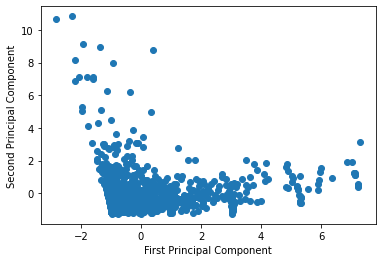

In [41]:
plt.scatter(x_pca[:, 0], x_pca[:, 1], cmap ='plasma')
  
# labeling x and y axes
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')

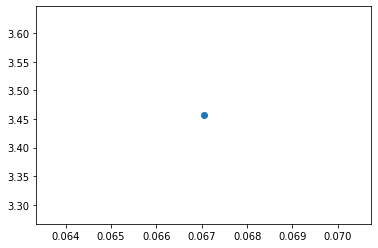

In [42]:
plt.scatter(x_pca[0, 0], x_pca[0, 1], cmap ='plasma')

# K means implementation

[2 0 0 ... 0 0 0]
      0
0     2
1     0
2     0
3     0
4     0
...  ..
1193  0
1194  0
1195  0
1196  0
1197  0

[1198 rows x 1 columns]


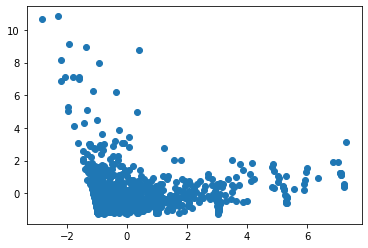

In [45]:
from sklearn.cluster import KMeans
%matplotlib inline
Kmean = KMeans(n_clusters=3)
Kmean.fit(x_pca)
Kmean.cluster_centers_
plt.scatter(x_pca[ : ,0], x_pca[ : , 1])

k1 = Kmean.labels_

print(k1)
df1 = pd.DataFrame(k1)
print(df)


In [47]:
df1.value_counts()

0    1003
1     152
2      43
dtype: int64

In [48]:
print(df.index)
print(k1[0])

RangeIndex(start=0, stop=1198, step=1)
2


In [52]:
Final_Best_sellers = []
cnt = 0
for index1 in df.index :
    if(k1[cnt]==2):
        Final_Best_sellers.append("seller " +str(index1+1))
    cnt=cnt+1

In [53]:
#final best sellers list
Final_Best_sellers

['seller 1',
 'seller 12',
 'seller 15',
 'seller 18',
 'seller 19',
 'seller 22',
 'seller 23',
 'seller 35',
 'seller 79',
 'seller 85',
 'seller 112',
 'seller 157',
 'seller 174',
 'seller 270',
 'seller 271',
 'seller 324',
 'seller 366',
 'seller 377',
 'seller 397',
 'seller 402',
 'seller 418',
 'seller 450',
 'seller 481',
 'seller 498',
 'seller 503',
 'seller 507',
 'seller 513',
 'seller 566',
 'seller 574',
 'seller 577',
 'seller 581',
 'seller 585',
 'seller 620',
 'seller 649',
 'seller 675',
 'seller 712',
 'seller 728',
 'seller 759',
 'seller 760',
 'seller 772',
 'seller 956',
 'seller 1159',
 'seller 1183']

In [54]:
len(Final_Best_sellers)

43